In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import anndata as ad
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import hdf5plugin
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import sys
import os
import dill
import gzip

In [97]:
drg = sc.read_h5ad("/Users/cristalvillalba/Downloads/DRG_integration/analysis/drg_concat.h5ad")

In [103]:
with gzip.open('/Users/cristalvillalba/Downloads/DRG_integration/analysis/drg_concat_obs.txt.gz', 'rt') as f:
    var = [line.strip() for line in f]

In [101]:
with gzip.open('/Users/cristalvillalba/Downloads/DRG_integration/analysis/drg_concat_var.txt', 'rt') as f:
    obs = [line.strip() for line in f]

FileNotFoundError: [Errno 2] No such file or directory: '/Users/cristalvillalba/Downloads/DRG_integration/analysis/drg_concat_var.txt'

In [19]:
var = var[1:]

In [105]:
obs = obs[1:] 

NameError: name 'obs' is not defined

In [36]:
type(drg)

AnnData object with n_obs × n_vars = 128638 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'age', 'gender', 'donor', 'platform', 'librarytype', 'genotype', 'info', 'sampleid', 'leiden'
    uns: 'log1p'
    obsm: 'X_scVI', 'X_umap'

In [28]:
drg.var

""
Xkr4
Gm1992
Gm19938
Gm37381
Rp1
...
AC124606.1
AC133095.2
AC133095.1
AC234645.1


In [14]:
len(var)

128639

In [15]:
len(obs)

32286

In [41]:
drg

AnnData object with n_obs × n_vars = 128638 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'age', 'gender', 'donor', 'platform', 'librarytype', 'genotype', 'info', 'sampleid', 'leiden'
    uns: 'log1p', 'sampleid_colors'
    obsm: 'X_scVI', 'X_umap'

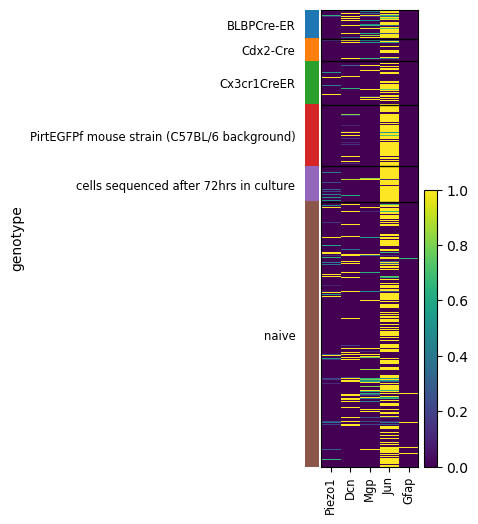

In [44]:
sc.pl.heatmap(drg, groupby = 'genotype', standard_scale = 'obs', var_names = ['Piezo1', 'Dcn', 'Mgp', 'Jun', 'Gfap'], save='onhtest.pdf')

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:401: PerformanceWa

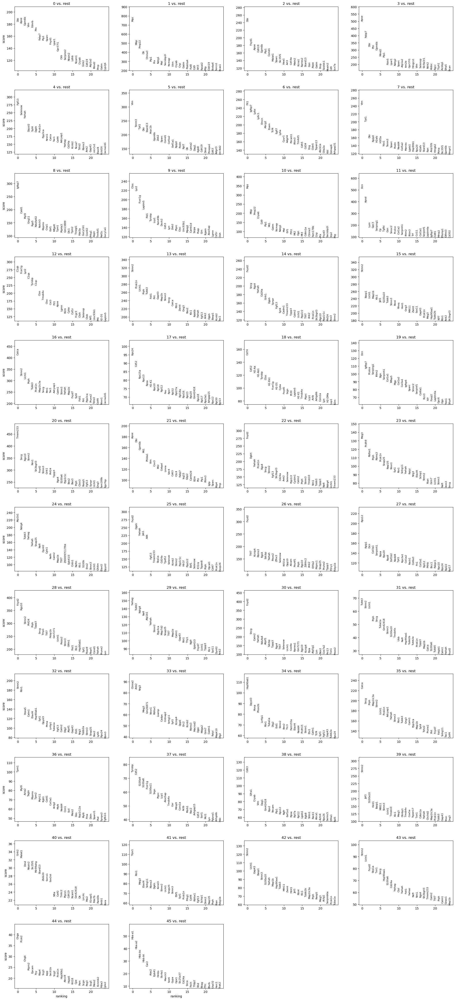

AnnData object with n_obs × n_vars = 128638 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'age', 'gender', 'donor', 'platform', 'librarytype', 'genotype', 'info', 'sampleid', 'leiden'
    uns: 'log1p', 'sampleid_colors', 'age_colors', 'gender_colors', 'genotype_colors', 't-test'
    obsm: 'X_scVI', 'X_umap'

In [45]:
sc.tl.rank_genes_groups(drg, 'leiden', method='t-test', key_added = "t-test")
sc.pl.rank_genes_groups(drg, n_genes=25, sharey=False, key = "t-test")

# results are stored in the adata.uns["t-test"] slot
drg

In [ ]:
##. Logistic regression test
sc.tl.rank_genes_groups(on, 'leiden', method='logreg',key_added = "logreg")
sc.pl.rank_genes_groups(on, n_genes=25, sharey=False, key = "logreg")

In [ ]:
### plot metadata sampleid, age, gender donor,genotype, info

In [53]:
#### Identification of clusters based on known marker genes

marker_genes_dict = {
    "Fibroblast": ["Dcn", "Mgp", "Ptgds"],
    "Macrophage": ["Cd68", "Cd96"],
    "Schwann_M": ["Mpz", "Prx", "Mbp"],
    "Schwann_N": ["Cadm2", "Scn7a"],
    "SatGlia": ["Tyrp1", "Fabp7", "Ednrb"],
    "Endothelial": ["Pecam1", "Cd34", "Egfl7", "Cldn5"],
    "Neuron": ["Calca", "Ntrk3", "Prph"],
    "Pericyte": ["Kcnj8", "Notch3"],
    "Lymphoid": ["Cd5", "Pou2af1"],
    "Myeloid": ["Cd80", "Mpo", "S100a9"],
    "Erythrocyte": ["Mpp1", "Spta1", "Hbb-bs", "Hba-a2", "Hba-a1", "Hbb-bt"],
    "c-LTMR": ["Th", "P2ry1", "Pvalb"],
    "adelta-LMTR": ["Ntrk2", "Ntng1", "Tmem108"],
    "Sst": ["Sst", "Nppb", "Oprm1"],
    "NP1": ["Chrna3", "Gfra2"],
    "NP2": ["Chrna3", "Il31ra", "Gfra1"],
    "NP3": ["Chrna3", "Oprm1"],
    "Proprioceptor": ["Ina", "Shh", "Smpx"],
    "PEP": ["Gria4", "Trpa1", "Hopx"],
    "Cold nociceptor": ["Trpm8", "Runx1", "Isl1"],
       
}

         Falling back to preprocessing with `sc.pp.pca` and default params.
categories: 0, 1, 2, etc.
var_group_labels: Fibroblast, Macrophage, Schwann, etc.


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


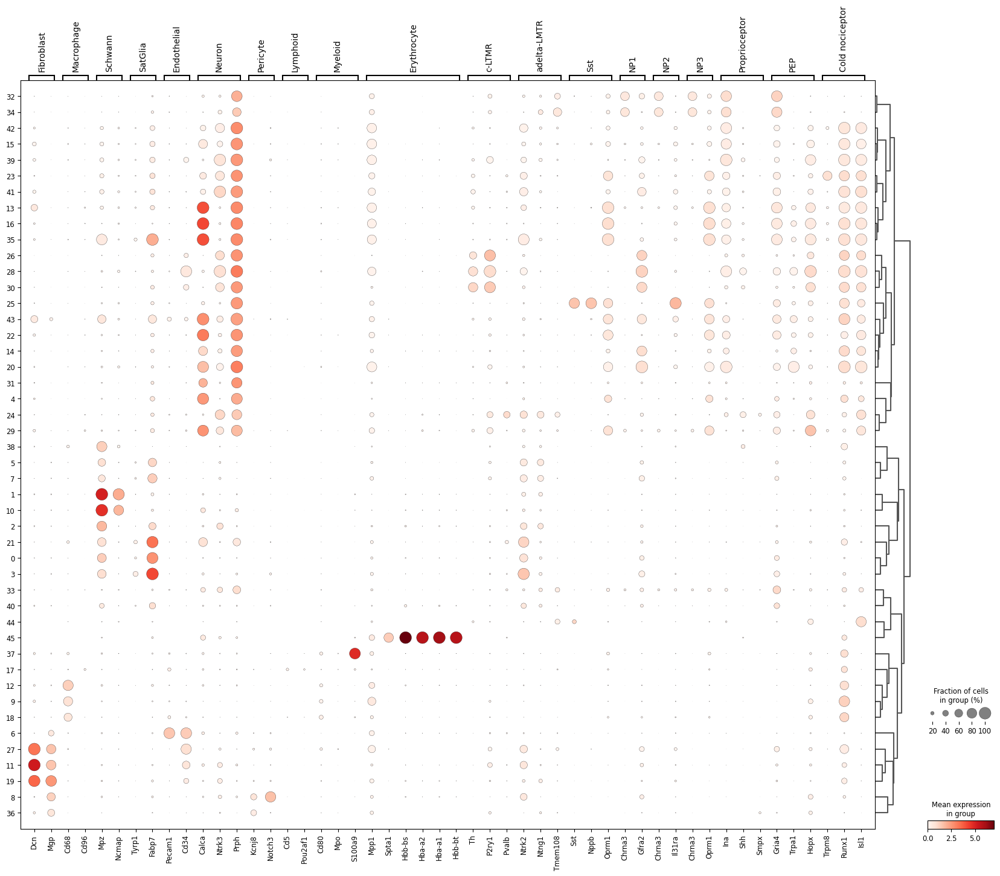

In [54]:
sc.pl.dotplot(drg, marker_genes_dict, "leiden", dendrogram=True)

In [50]:
drg.var_names

Index(['Xkr4', 'Gm1992', 'Gm19938', 'Gm37381', 'Rp1', 'Sox17', 'Gm37587',
       'Gm37323', 'Mrpl15', 'Lypla1',
       ...
       'Gm16367', 'AC163611.1', 'AC163611.2', 'AC140365.1', 'AC124606.2',
       'AC124606.1', 'AC133095.2', 'AC133095.1', 'AC234645.1', 'AC149090.1'],
      dtype='object', length=32285)

In [56]:
sc.pp.neighbors(drg)

In [ ]:
sc.tl.umap(drg)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


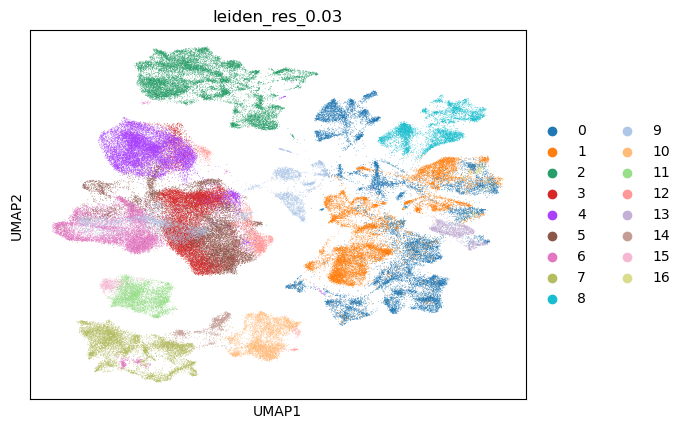

In [70]:
sc.pl.umap(drg, color=["leiden_res_0.03"])

In [68]:
for res in [0.04, 0.03, 0.1]:
    sc.tl.leiden(
        drg, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


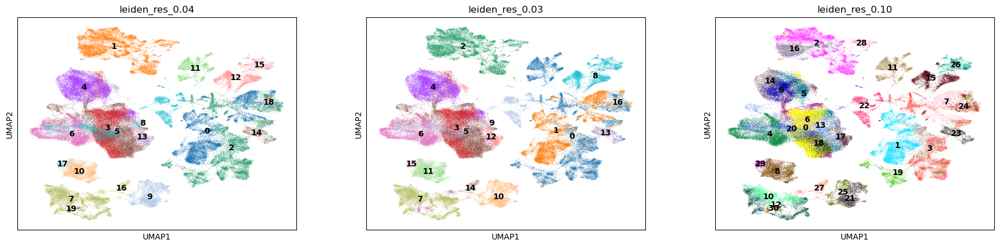

In [69]:
sc.pl.umap(
    drg,
    color=["leiden_res_0.04", "leiden_res_0.03", "leiden_res_0.10"],
    legend_loc="on data",
)

categories: 0, 1, 2, etc.
var_group_labels: Fibroblast, Macrophage, Schwann, etc.


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


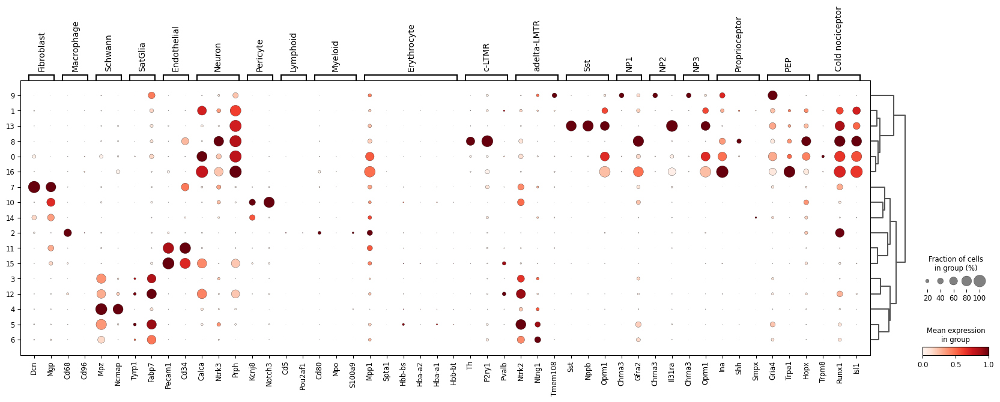

In [73]:
sc.pl.dotplot(drg, marker_genes_dict, "leiden_res_0.03", dendrogram=True, standard_scale="var")

In [75]:
drg.obs["cell_type_lvl1"] = drg.obs["leiden_res_0.03"].map(
    {
        "0": "Neuron",
        "1": "Neuron",
        "2": "Non-neuron",
        "3": "Non-neuron",
        "4": "Non-neuron",
        "5": "Neuron",
        "6": "Neuron",
        "7": "Non-neuron",
        "8": "Neuron",
        "9": "Neuron",
        "10": "Non-neuron",
        "11": "Non-neuron",
        "12": "Non-neuron",
        "13": "Neuron",
        "14": "Neuron",
        "15": "Non-neuron",
        "16": "Neuron",
    }
)

In [76]:
drg.obs["cell_type_lvl1"]

AAACCCAAGGAGGCAG-1    Neuron
AAACCCAAGTATGCAA-1    Neuron
AAACCCAAGTGCCGAA-1    Neuron
AAACCCAAGTTCCATG-1    Neuron
AAACCCACAAATCGGG-1    Neuron
                       ...  
TTTGTTGGTACTAGCT-1    Neuron
TTTGTTGGTCCAGGTC-1    Neuron
TTTGTTGTCCGAACGC-1    Neuron
TTTGTTGTCCGGGACT-1    Neuron
TTTGTTGTCTAAGCGT-1    Neuron
Name: cell_type_lvl1, Length: 128638, dtype: object

In [77]:
drg.obs["cell_type_lvl2"] = drg.obs["leiden_res_0.03"].map(
    {
        "0": "Neuron Calca+",
        "1": "Neuron Prph+",
        "2": "Macrophage",
        "3": "SatGlia Tyrp1+",
        "4": "Schwann",
        "5": "a-delta Ntrk2+",
        "6": "a-delta Ntng1+",
        "7": "Fibroblast",
        "8": "NP1",
        "9": "PEP",
        "10": "Pericyte",
        "11": "Endothelial Cd34+",
        "12": "SatGlia Fabp7+",
        "13": "Sst",
        "14": "cold nociceptor",
        "15": "Endothelial Pecam1+",
        "16": "Proprioceptor",
    }
)

In [78]:
drg.obs["cell_type_lvl2"]

AAACCCAAGGAGGCAG-1      Neuron Calca+
AAACCCAAGTATGCAA-1                NP1
AAACCCAAGTGCCGAA-1      Neuron Calca+
AAACCCAAGTTCCATG-1      Neuron Calca+
AAACCCACAAATCGGG-1     a-delta Ntrk2+
                           ...       
TTTGTTGGTACTAGCT-1    cold nociceptor
TTTGTTGGTCCAGGTC-1                PEP
TTTGTTGTCCGAACGC-1                PEP
TTTGTTGTCCGGGACT-1                PEP
TTTGTTGTCTAAGCGT-1                PEP
Name: cell_type_lvl2, Length: 128638, dtype: category
Categories (17, object): ['Neuron Calca+', 'Neuron Prph+', 'Macrophage', 'SatGlia Tyrp1+', ..., 'Sst', 'cold nociceptor', 'Endothelial Pecam1+', 'Proprioceptor']

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


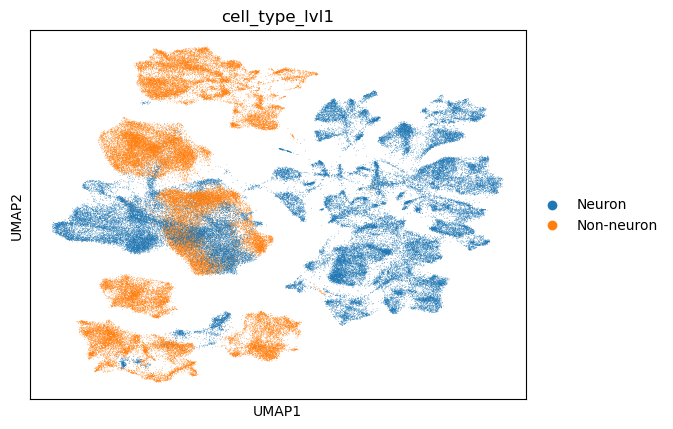

In [79]:
sc.pl.umap(drg, color=["cell_type_lvl1"])

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


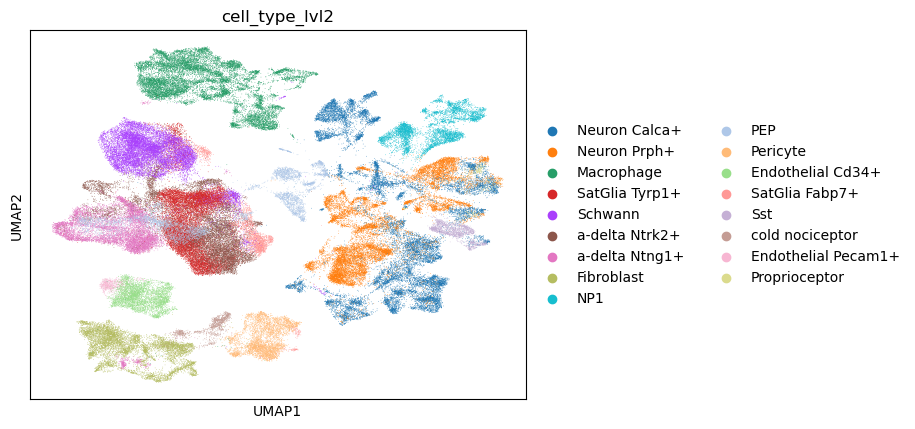

In [80]:
sc.pl.umap(drg, color=["cell_type_lvl2"])

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


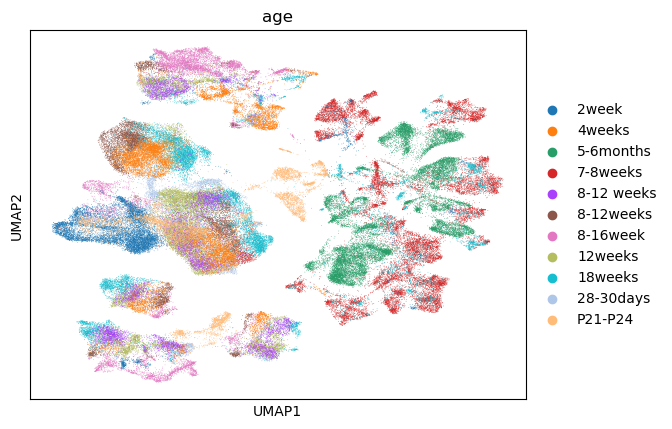

In [82]:
sc.pl.umap(drg, color=["age"])

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


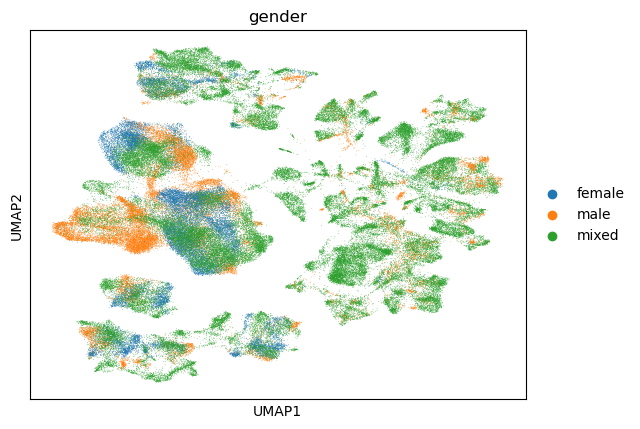

In [83]:
sc.pl.umap(drg, color=["gender"])

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


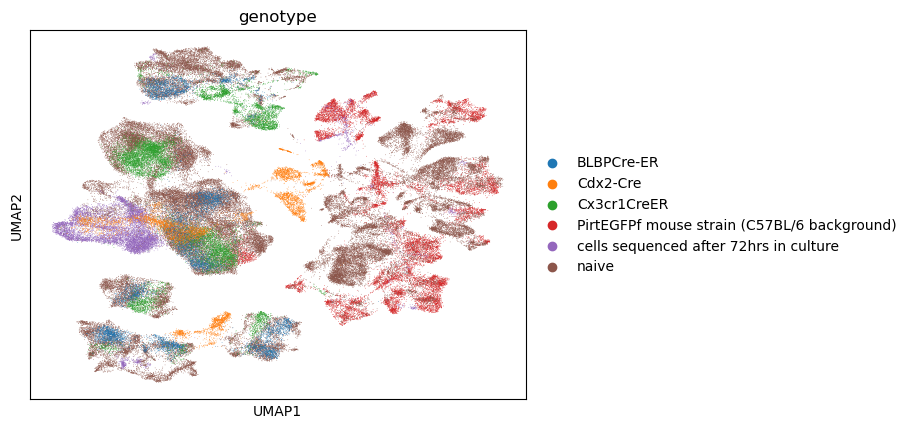

In [84]:
sc.pl.umap(drg, color=["genotype"])

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


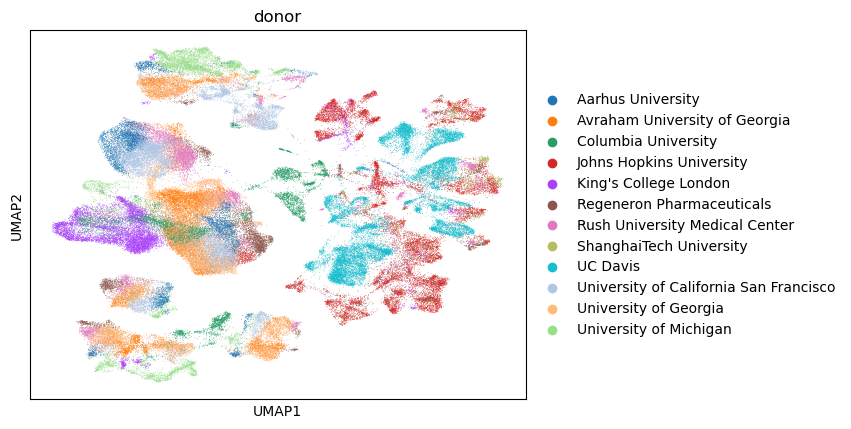

In [86]:
sc.pl.umap(drg, color=["donor"])

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


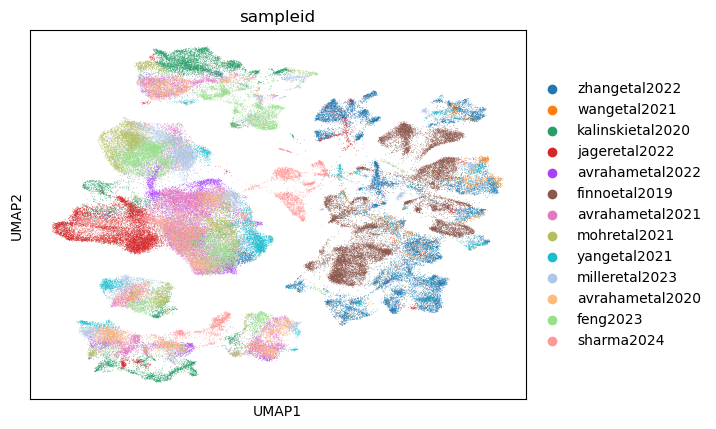

In [88]:
sc.pl.umap(drg, color=["sampleid"])

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


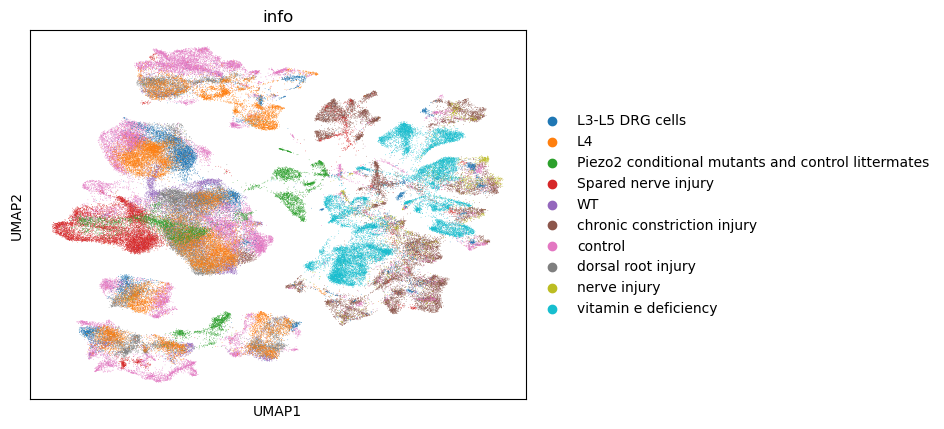

In [89]:
sc.pl.umap(drg, color=["info"])

In [91]:
### degs for each cluster
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(drg, groupby="cell_type_lvl2", method="wilcoxon")

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


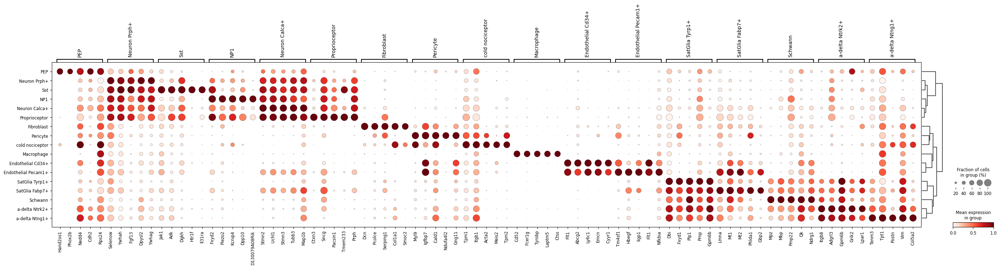

In [92]:
sc.pl.rank_genes_groups_dotplot(
    drg, groupby="cell_type_lvl2", standard_scale="var", n_genes=5
)

In [ ]:
sc.get.rank_genes_groups_df(drg, group="0").head(5)

categories: Neuron Calca+, Neuron Prph+, Macrophage, etc.
var_group_labels: Fibroblast, Macrophage, Schwann, etc.


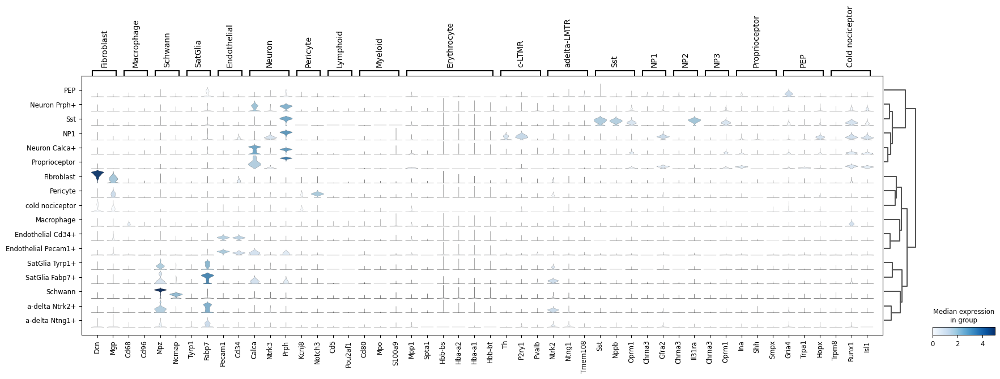

In [94]:
ax = sc.pl.stacked_violin(
    drg, marker_genes_dict, groupby="cell_type_lvl2", swap_axes=False, dendrogram=True
)

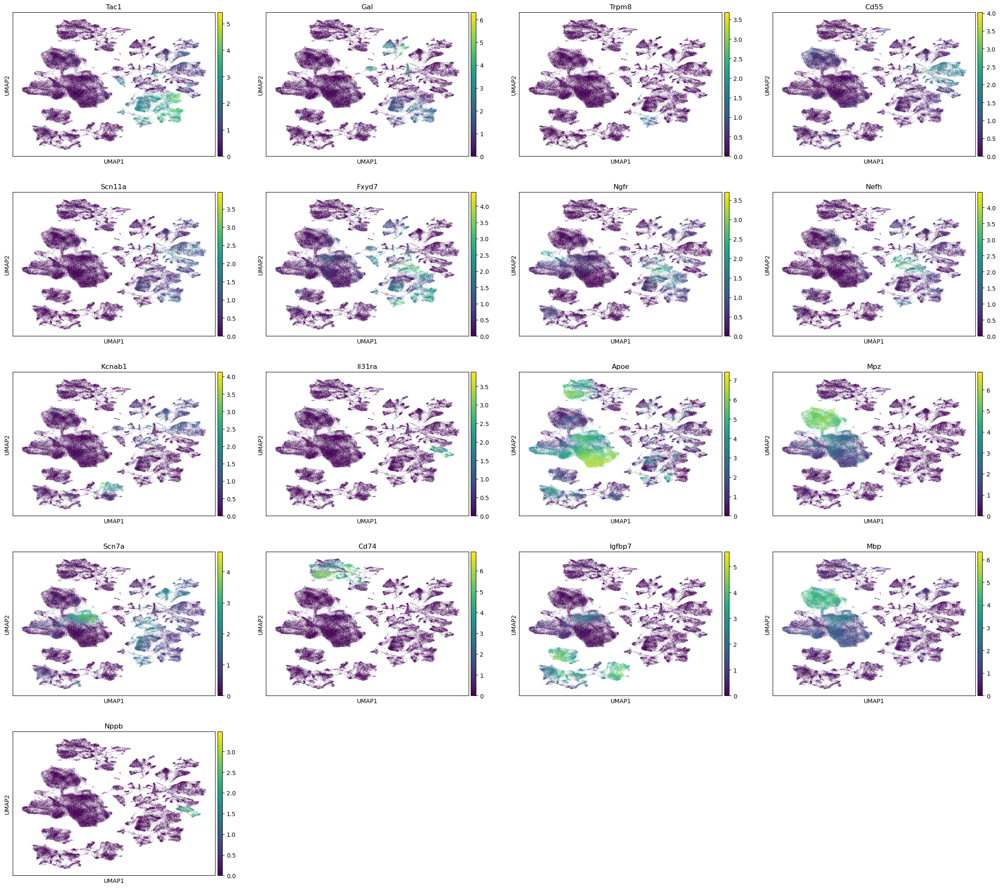

In [95]:
markers = ["Tac1","Gal","Trpm8","Cd55","Scn11a","Fxyd7","Ngfr","Nefh","Kcnab1","Il31ra","Apoe","Mpz","Scn7a","Cd74","Igfbp7", 'Mbp','Nppb']

sc.pl.umap(drg,  color=markers)

In [96]:
##To save the new results
drg.write_h5ad("drganno.h5ad")

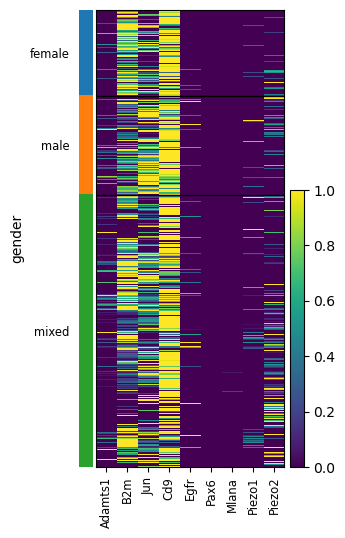

In [128]:
sc.pl.heatmap(drg, groupby = 'gender', standard_scale = 'obs', var_names = ['Adamts1','B2m','Jun','Cd9','Egfr','Pax6','Mlana','Piezo1', 'Piezo2'], save='drgtest.pdf')

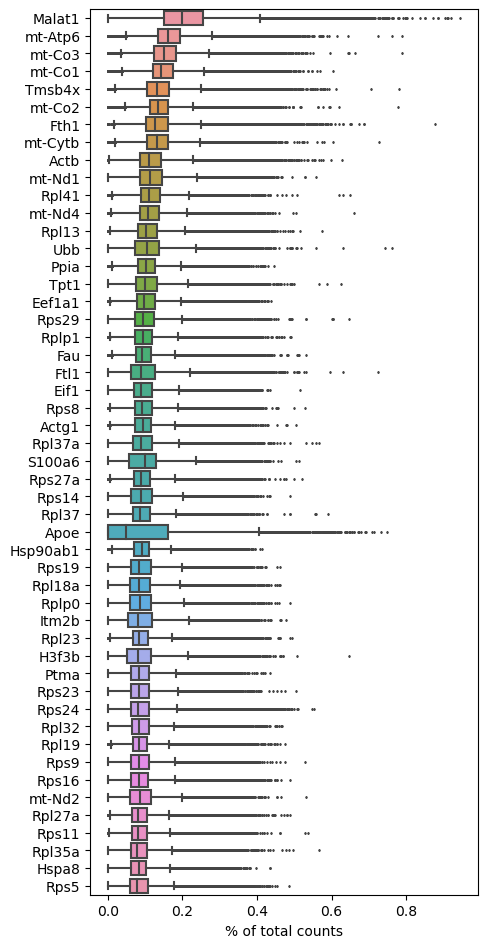

In [100]:
sc.pl.highest_expr_genes(drg, n_top=50)

In [106]:
cell_types = drg.obs['cell_type_lvl2'].unique()

In [108]:
celltypes = pd.DataFrame(drg.obs['cell_type_lvl2'])

In [109]:
celltypes

,cell_type_lvl2
AAACCCAAGGAGGCAG-1,Neuron Calca+
AAACCCAAGTATGCAA-1,NP1
AAACCCAAGTGCCGAA-1,Neuron Calca+
AAACCCAAGTTCCATG-1,Neuron Calca+
AAACCCACAAATCGGG-1,a-delta Ntrk2+
...,...
TTTGTTGGTACTAGCT-1,cold nociceptor
TTTGTTGGTCCAGGTC-1,PEP
TTTGTTGTCCGAACGC-1,PEP
TTTGTTGTCCGGGACT-1,PEP


In [110]:
# Step 1: Compute percentage of each cell type
celltypes = drg.obs['cell_type_lvl2'].unique()
percentage = drg.obs['cell_type_lvl2'].value_counts(normalize=True) * 100

In [111]:
percentage

cell_type_lvl2
Neuron Calca+          14.035511
Neuron Prph+           11.411869
Macrophage             11.035619
SatGlia Tyrp1+          9.932524
Schwann                 9.789487
a-delta Ntrk2+          9.646450
a-delta Ntng1+          7.070228
Fibroblast              6.385360
NP1                     4.220370
PEP                     3.996486
Pericyte                3.563488
Endothelial Cd34+       3.496634
SatGlia Fabp7+          2.222516
Sst                     1.407049
cold nociceptor         0.951507
Endothelial Pecam1+     0.530170
Proprioceptor           0.304731
Name: proportion, dtype: float64

In [112]:
percentage_df = pd.DataFrame({'Cell_Type': percentage.index, 'Percentage': percentage.values})

In [113]:
percentage_df

,Cell_Type,Percentage
0,Neuron Calca+,14.035511
1,Neuron Prph+,11.411869
2,Macrophage,11.035619
3,SatGlia Tyrp1+,9.932524
4,Schwann,9.789487
5,a-delta Ntrk2+,9.646450
6,a-delta Ntng1+,7.070228
7,Fibroblast,6.385360
8,NP1,4.220370
9,PEP,3.996486


In [114]:
percentage_df = percentage_df.sort_values(by='Percentage', ascending=False)

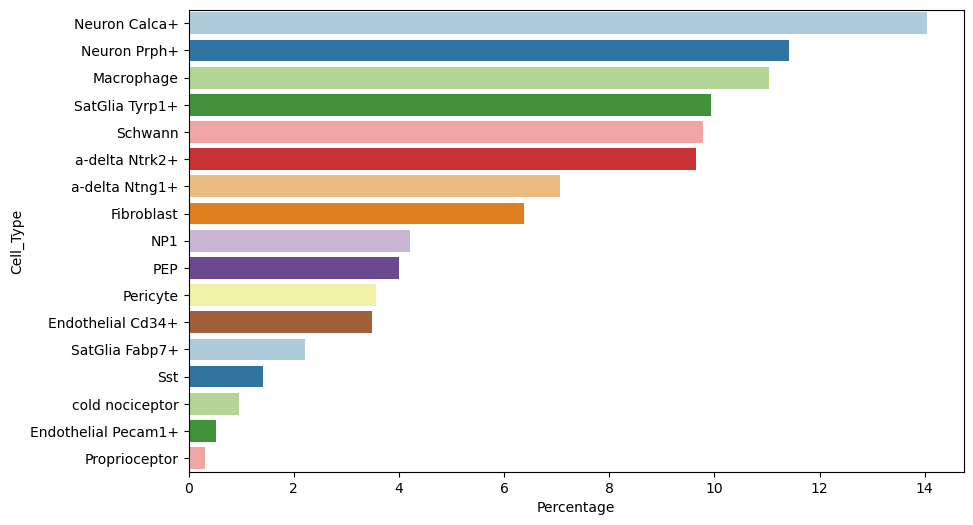

In [119]:
# Step 4: Create bar plot using Seaborn/Matplotlib
plt.figure(figsize=(10, 6))
barplot = sns.barplot(data=percentage_df, x='Percentage', y='Cell_Type', palette='Paired')

In [123]:
counts = drg.obs['cell_type_lvl2'].value_counts

In [4]:
drg = sc.read_h5ad("/Users/cristalvillalba/Downloads/DRG_integration/analysis/drganno.h5ad")

In [110]:
drg.obs["cell_type_lvl2"]

AAACCCAAGGAGGCAG-1      Neuron Calca+
AAACCCAAGTATGCAA-1                NP1
AAACCCAAGTGCCGAA-1      Neuron Calca+
AAACCCAAGTTCCATG-1      Neuron Calca+
AAACCCACAAATCGGG-1     a-delta Ntrk2+
                           ...       
TTTGTTGGTACTAGCT-1    cold nociceptor
TTTGTTGGTCCAGGTC-1                PEP
TTTGTTGTCCGAACGC-1                PEP
TTTGTTGTCCGGGACT-1                PEP
TTTGTTGTCTAAGCGT-1                PEP
Name: cell_type_lvl2, Length: 128638, dtype: category
Categories (17, object): ['Neuron Calca+', 'Neuron Prph+', 'Macrophage', 'SatGlia Tyrp1+', ..., 'Sst', 'cold nociceptor', 'Endothelial Pecam1+', 'Proprioceptor']

In [5]:
counts = drg.obs['cell_type_lvl2'].value_counts

In [12]:
import pandas as pd

# Creating the DataFrame
drg = pd.DataFrame(drg.obs["cell_type_lvl2"])

# Accessing the 'obs' DataFrame (in this case, it's the same as drg)
drg.obs = drg

# Counting the occurrences of each type in 'cell_type_lvl2'
percentage = drg.obs['cell_type_lvl2'].value_counts()

print(percentage)


cell_type_lvl2
Neuron Calca+          18055
Neuron Prph+           14680
Macrophage             14196
SatGlia Tyrp1+         12777
Schwann                12593
a-delta Ntrk2+         12409
a-delta Ntng1+          9095
Fibroblast              8214
NP1                     5429
PEP                     5141
Pericyte                4584
Endothelial Cd34+       4498
SatGlia Fabp7+          2859
Sst                     1810
cold nociceptor         1224
Endothelial Pecam1+      682
Proprioceptor            392
Name: count, dtype: int64


/var/folders/lx/lp60ynh54hqb_zgh_cgbxbt40000gn/T/ipykernel_31709/3533111216.py:7: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  drg.obs = drg


In [10]:
percentage

<bound method IndexOpsMixin.value_counts of AAACCCAAGGAGGCAG-1      Neuron Calca+
AAACCCAAGTATGCAA-1                NP1
AAACCCAAGTGCCGAA-1      Neuron Calca+
AAACCCAAGTTCCATG-1      Neuron Calca+
AAACCCACAAATCGGG-1     a-delta Ntrk2+
                           ...       
TTTGTTGGTACTAGCT-1    cold nociceptor
TTTGTTGGTCCAGGTC-1                PEP
TTTGTTGTCCGAACGC-1                PEP
TTTGTTGTCCGGGACT-1                PEP
TTTGTTGTCTAAGCGT-1                PEP
Name: cell_type_lvl2, Length: 128638, dtype: category
Categories (17, object): ['Neuron Calca+', 'Neuron Prph+', 'Macrophage', 'SatGlia Tyrp1+', ..., 'Sst', 'cold nociceptor', 'Endothelial Pecam1+', 'Proprioceptor']>

In [ ]:
### For more information about analysis, please visit https://www.sc-best-practices.org/conditions/gsea_pathway.html

In [4]:
drg = sc.read_h5ad("/Users/cristalvillalba/Downloads/DRG_integration/analysis/drganno.h5ad")

In [5]:
drg.obs['age']

AAACCCAAGGAGGCAG-1    Johns Hopkins University
AAACCCAAGTATGCAA-1    Johns Hopkins University
AAACCCAAGTGCCGAA-1    Johns Hopkins University
AAACCCAAGTTCCATG-1    Johns Hopkins University
AAACCCACAAATCGGG-1    Johns Hopkins University
                                ...           
TTTGTTGGTACTAGCT-1         Columbia University
TTTGTTGGTCCAGGTC-1         Columbia University
TTTGTTGTCCGAACGC-1         Columbia University
TTTGTTGTCCGGGACT-1         Columbia University
TTTGTTGTCTAAGCGT-1         Columbia University
Name: donor, Length: 128638, dtype: category
Categories (12, object): ['Aarhus University', 'Avraham University of Georgia', 'Columbia University', 'Johns Hopkins University', ..., 'UC Davis', 'University of California San Francisco', 'University of Georgia', 'University of Michigan']

In [5]:
drg_sn=drg[~drg.obs['age'].isin(['7-8weeks', '2week', '18weeks', '8-12 weeks', '4weeks', '5-6months', '8-16week', '12weeks', '28-30days', 'P21-P24'])]

In [6]:
drg_sn

View of AnnData object with n_obs × n_vars = 8185 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'age', 'gender', 'donor', 'platform', 'librarytype', 'genotype', 'info', 'sampleid', 'leiden', 'leiden_res_0.02', 'leiden_res_0.50', 'leiden_res_2.00', 'leiden_res_0.08', 'leiden_res_0.04', 'leiden_res_0.10', 'leiden_res_0.20', 'leiden_res_0.03', 'cell_type_lvl1', 'cell_type_lvl2'
    uns: 'age_colors', 'cell_type_lvl1_colors', 'cell_type_lvl2_colors', 'dendrogram_cell_type_lvl2', 'dendrogram_leiden', 'dendrogram_leiden_res_0.03', 'donor_colors', 'gender_colors', 'genotype_colors', 'info_colors', 'leiden', 'leiden_colors', 'leiden_res_0.02_colors', 'leiden_res_0.03_colors', 'leiden_res_0.04_colors', 'leiden_res_0.08_colors', 'leiden_res_0.10_colors', 'leiden_res_0.20_colors', 'leiden_res_0.50_colors', 'leiden_res_2.00_colors', 'log1p', 'neighbors', 'rank_genes_groups', 'sampleid_colors', 't-test'
    obsm: 'X_pca', 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


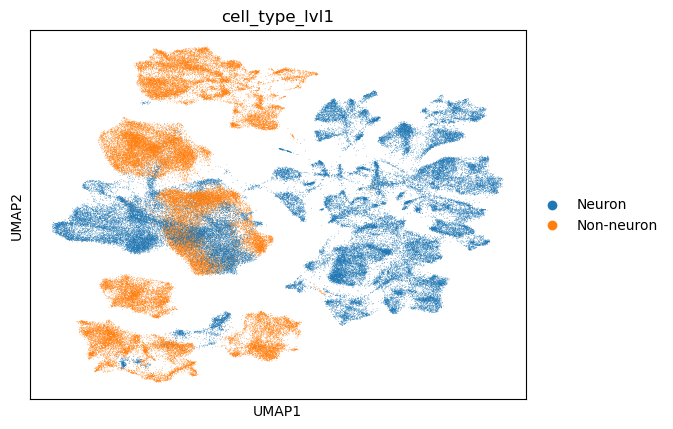

In [6]:
sc.pl.umap(drg, color=["cell_type_lvl1"])

In [8]:
#Redo clustering 
# Normalizing to median total counts
sc.pp.normalize_total(drg_sn)
# Logarithmize the data
sc.pp.log1p(drg_sn)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [9]:
sc.pp.highly_variable_genes(drg_sn, n_top_genes=2000, batch_key="sampleid")

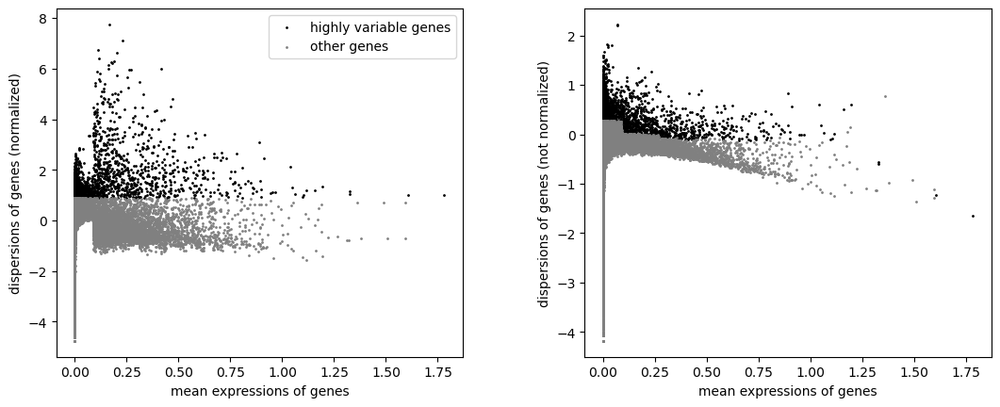

In [10]:
sc.pl.highly_variable_genes(drg_sn)

In [11]:
sc.tl.pca(drg_sn)

In [12]:
sc.pp.neighbors(drg_sn)

In [13]:
sc.tl.umap(drg_sn)

In [34]:
for res in [0.1, 0.3, 0.5]:
    sc.tl.leiden(
        drg_sn, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


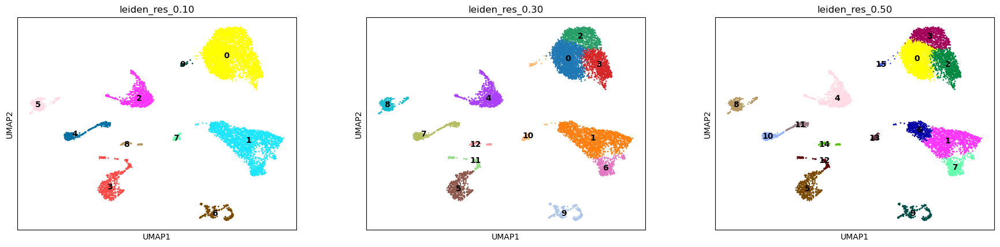

In [35]:
sc.pl.umap(
    drg_sn,
    color=["leiden_res_0.10", "leiden_res_0.30", "leiden_res_0.50"],
    legend_loc="on data",
)

In [36]:
#### Identification of clusters based on known marker genes

marker_genes_dict = {
    "Fibroblast": ["Dcn", "Mgp", "Ptgds"],
    "Macrophage": ["Cd68", "Cd96"],
    "Schwann_M": ["Mpz", "Prx", "Mbp"],
    "Schwann_N": ["Cadm2", "Scn7a"],
    "SatGlia": ["Tyrp1", "Fabp7", "Ednrb"],
    "Endothelial": ["Pecam1", "Cd34", "Egfl7", "Cldn5"],
    "Neuron": ["Calca", "Ntrk3", "Prph"],
    "Pericyte": ["Kcnj8", "Notch3"],
    "Lymphoid": ["Cd5", "Pou2af1"],
    "Myeloid": ["Cd80", "Mpo", "S100a9"],
    "Erythrocyte": ["Mpp1", "Spta1", "Hbb-bs", "Hba-a2", "Hba-a1", "Hbb-bt"],
    "c-LTMR": ["Th", "P2ry1", "Pvalb"],
    "adelta-LMTR": ["Ntrk2", "Ntng1", "Tmem108"],
    "Sst": ["Sst", "Nppb", "Oprm1"],
    "NP1": ["Chrna3", "Gfra2"],
    "NP2": ["Chrna3", "Il31ra", "Gfra1"],
    "NP3": ["Chrna3", "Oprm1"],
    "Proprioceptor": ["Ina", "Shh", "Smpx"],
    "PEP": ["Gria4", "Trpa1", "Hopx"],
    "Cold nociceptor": ["Trpm8", "Runx1", "Isl1"],
       
}

categories: 0, 1, 2, etc.
var_group_labels: Fibroblast, Macrophage, Schwann_M, etc.


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


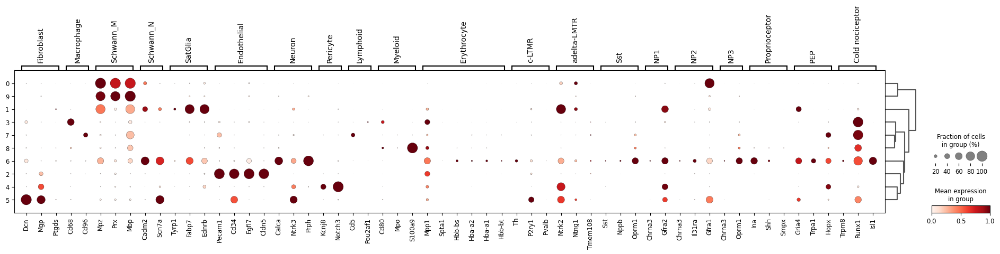

In [37]:
sc.pl.dotplot(drg_sn, marker_genes_dict, "leiden_res_0.10", dendrogram=True, standard_scale="var")

In [38]:
drg_sn.obs["celltype"] = drg.obs["leiden_res_0.10"].map(
    {
        "0": "Schwann_M",
        "1": "SatGlia",
        "2": "Endothelial",
        "3": "Macrophage",
        "4": "Pericyte",
        "5": "Fibroblast",
        "6": "Neuron",
        "7": "Lymphoid",
        "8": "Myeloid",
        "9": "Schwann_N",
    }
)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


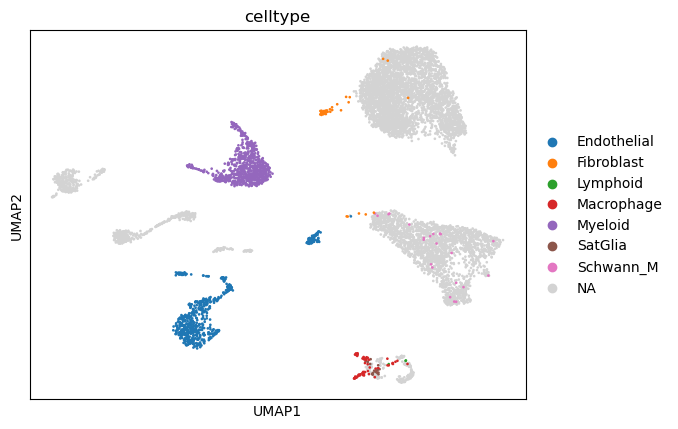

In [39]:
sc.pl.umap(drg_sn, color=["celltype"])

In [21]:
drg_sn

AnnData object with n_obs × n_vars = 8185 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'age', 'gender', 'donor', 'platform', 'librarytype', 'genotype', 'info', 'sampleid', 'leiden', 'leiden_res_0.02', 'leiden_res_0.50', 'leiden_res_2.00', 'leiden_res_0.08', 'leiden_res_0.04', 'leiden_res_0.10', 'leiden_res_0.20', 'leiden_res_0.03', 'cell_type_lvl1', 'cell_type_lvl2', 'leiden_res_0.30', 'celltype'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'age_colors', 'cell_type_lvl1_colors', 'cell_type_lvl2_colors', 'dendrogram_cell_type_lvl2', 'dendrogram_leiden', 'dendrogram_leiden_res_0.03', 'donor_colors', 'gender_colors', 'genotype_colors', 'info_colors', 'leiden', 'leiden_colors', 'leiden_res_0.02_colors', 'leiden_res_0.03_colors', 'leiden_res_0.04_colors', 'leiden_res_0.08_colors', 'leiden_res_0.10_colors', 'leiden_res_0.20_colors', 'leide

In [40]:
drg=drg[~drg.obs['sampleid'].isin(['mohretal2021'])]

In [41]:
drg.obs['sampleid']

AAACCCAAGGAGGCAG-1    zhangetal2022
AAACCCAAGTATGCAA-1    zhangetal2022
AAACCCAAGTGCCGAA-1    zhangetal2022
AAACCCAAGTTCCATG-1    zhangetal2022
AAACCCACAAATCGGG-1    zhangetal2022
                          ...      
TTTGTTGGTACTAGCT-1       sharma2024
TTTGTTGGTCCAGGTC-1       sharma2024
TTTGTTGTCCGAACGC-1       sharma2024
TTTGTTGTCCGGGACT-1       sharma2024
TTTGTTGTCTAAGCGT-1       sharma2024
Name: sampleid, Length: 120453, dtype: category
Categories (12, object): ['zhangetal2022', 'wangetal2021', 'kalinskietal2020', 'jageretal2022', ..., 'milleretal2023', 'avrahametal2020', 'feng2023', 'sharma2024']

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


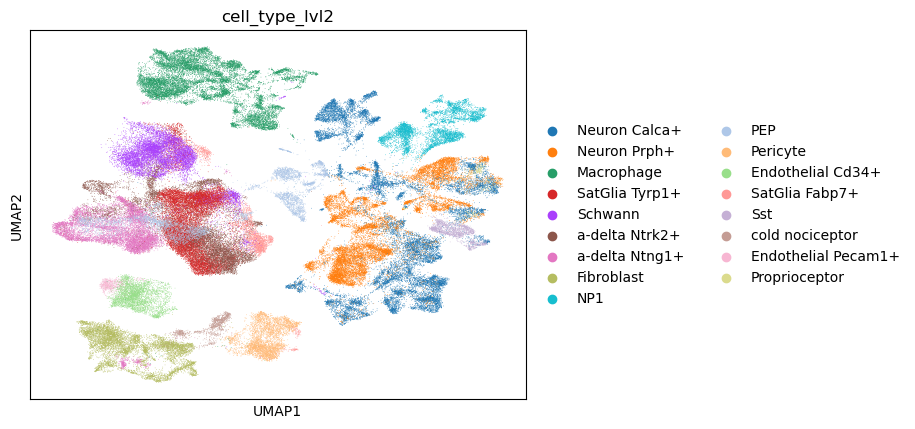

In [44]:
sc.pl.umap(drg, color=["cell_type_lvl2"])

In [43]:
drg

View of AnnData object with n_obs × n_vars = 120453 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'age', 'gender', 'donor', 'platform', 'librarytype', 'genotype', 'info', 'sampleid', 'leiden', 'leiden_res_0.02', 'leiden_res_0.50', 'leiden_res_2.00', 'leiden_res_0.08', 'leiden_res_0.04', 'leiden_res_0.10', 'leiden_res_0.20', 'leiden_res_0.03', 'cell_type_lvl1', 'cell_type_lvl2'
    uns: 'age_colors', 'cell_type_lvl1_colors', 'cell_type_lvl2_colors', 'dendrogram_cell_type_lvl2', 'dendrogram_leiden', 'dendrogram_leiden_res_0.03', 'donor_colors', 'gender_colors', 'genotype_colors', 'info_colors', 'leiden', 'leiden_colors', 'leiden_res_0.02_colors', 'leiden_res_0.03_colors', 'leiden_res_0.04_colors', 'leiden_res_0.08_colors', 'leiden_res_0.10_colors', 'leiden_res_0.20_colors', 'leiden_res_0.50_colors', 'leiden_res_2.00_colors', 'log1p', 'neighbors', 'rank_genes_groups', 'sampleid_colors', 't-test'
    obsm: 'X_pca', 'X_scVI', 'X_uma

In [230]:
#Redo clustering 
# Normalizing to median total counts
sc.pp.normalize_total(drg)
# Logarithmize the data
sc.pp.log1p(drg)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [231]:
sc.pp.highly_variable_genes(drg, n_top_genes=2000, batch_key="sampleid")

In [232]:
sc.tl.pca(drg)

In [236]:
sc.pp.neighbors(drg)

In [238]:
sc.tl.umap(drg)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


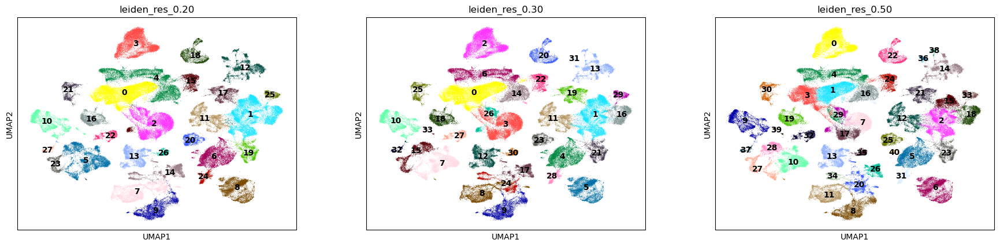

In [240]:
for res in [0.2, 0.3, 0.5]:
    sc.tl.leiden(
        drg, key_added=f"leiden_res_{res:4.2f}", resolution=res)
sc.pl.umap(
    drg,
    color=["leiden_res_0.20", "leiden_res_0.30", "leiden_res_0.50"],
    legend_loc="on data",
)

In [242]:
sc.pp.highly_variable_genes(drg, n_top_genes=2000, batch_key="sampleid")

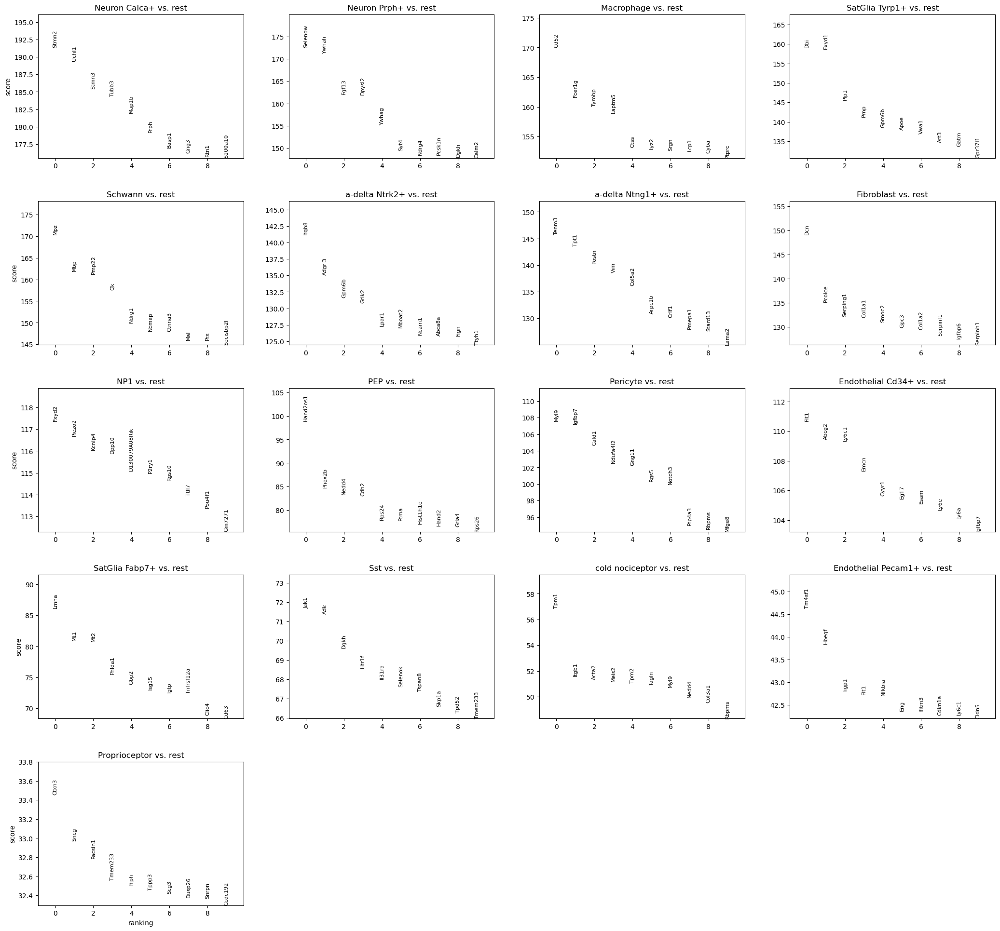

In [246]:
sc.pl.rank_genes_groups(drg, n_genes=10, sharey=False)

In [ ]:
pd.DataFrame(drg_sn.uns["rank_genes_groups"]["names"]).head(10)

In [ ]:
##To compare single cell with single nuclei DRG

In [81]:
sn_1 = sc.read_h5ad("/Users/cristalvillalba/Downloads/DRG_integration/comparison_sn_sc/snmoh2021.h5ad")

In [83]:
sn_1

AnnData object with n_obs × n_vars = 8185 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN_0.25_0.01_616', 'DF.classifications_0.25_0.01_616', 'pANN', 'DF.classifications'
    var: 'features'

In [45]:
sn_2 = sc.read_h5ad("/Users/cristalvillalba/Downloads/DRG_integration/comparison_sn_sc/snijunsn.h5ad")

In [248]:
drg

AnnData object with n_obs × n_vars = 120453 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'age', 'gender', 'donor', 'platform', 'librarytype', 'genotype', 'info', 'sampleid', 'leiden', 'leiden_res_0.02', 'leiden_res_0.50', 'leiden_res_2.00', 'leiden_res_0.08', 'leiden_res_0.04', 'leiden_res_0.10', 'leiden_res_0.20', 'leiden_res_0.03', 'cell_type_lvl1', 'cell_type_lvl2', 'leiden_res_0.30'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'age_colors', 'cell_type_lvl1_colors', 'cell_type_lvl2_colors', 'dendrogram_cell_type_lvl2', 'dendrogram_leiden', 'dendrogram_leiden_res_0.03', 'donor_colors', 'gender_colors', 'genotype_colors', 'info_colors', 'leiden', 'leiden_colors', 'leiden_res_0.02_colors', 'leiden_res_0.03_colors', 'leiden_res_0.04_colors', 'leiden_res_0.08_colors', 'leiden_res_0.10_colors', 'leiden_res_0.20_colors', 'leiden_res_0.50

In [163]:
#Redo clustering 
# Normalizing to median total counts
sc.pp.normalize_total(drg_sn)
# Logarithmize the data
sc.pp.log1p(drg_sn)

In [165]:
sc.pp.highly_variable_genes(drg_sn, n_top_genes=2000, batch_key="sampleid")

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


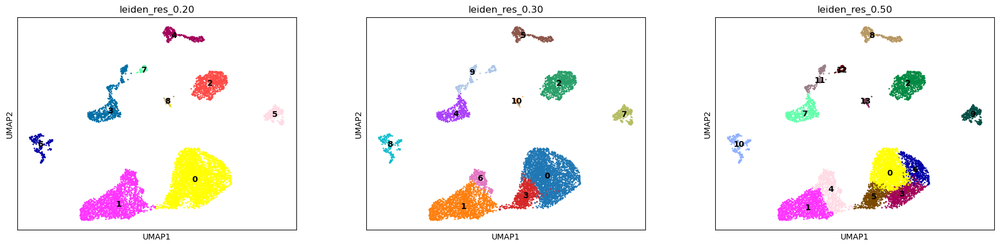

In [167]:
sc.pp.neighbors(drg_sn)
sc.tl.umap(drg_sn)
for res in [0.2, 0.3, 0.5]:
    sc.tl.leiden(
        drg_sn, key_added=f"leiden_res_{res:4.2f}", resolution=res)
sc.pl.umap(
    drg_sn,
    color=["leiden_res_0.20", "leiden_res_0.30", "leiden_res_0.50"],
    legend_loc="on data",
)

In [210]:
sc.tl.rank_genes_groups(drg_sn, groupby="leiden_res_0.20", method="wilcoxon")

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


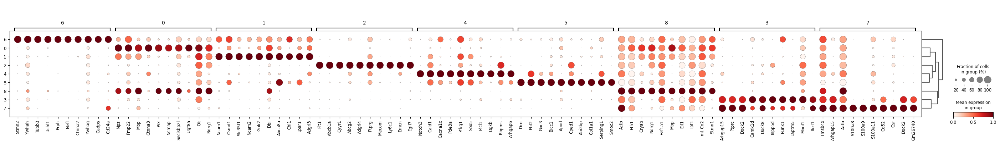

In [211]:
sc.pl.rank_genes_groups_dotplot(
    drg_sn, groupby="leiden_res_0.20", standard_scale="var", n_genes=10
)

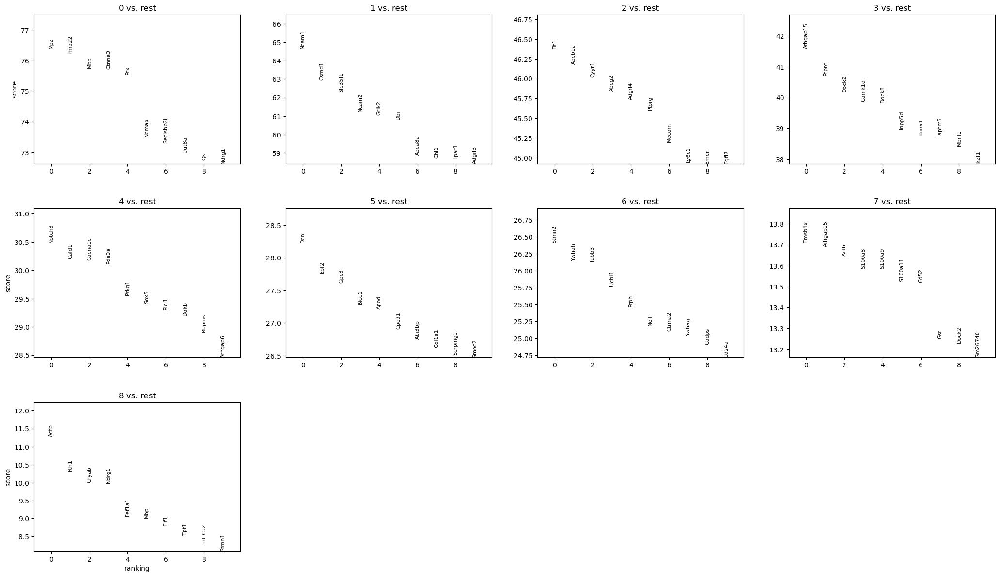

In [214]:
sc.pl.rank_genes_groups(drg_sn, n_genes=10, sharey=False)

In [199]:
pd.DataFrame(drg_sn.uns["rank_genes_groups"]["names"]).head(10)

,0,1,2,3,4,5,6,7,8,9,10
0,Pmp22,Ednrb,Flt1,Mpp6,C1qa,Notch3,Csmd1,Dcn,Stmn2,Ptprc,Actb
1,Mpz,Ncam2,Abcb1a,Nfib,Mrc1,Cald1,Cdh19,Ebf2,Ywhah,Dock2,Fth1
2,Cd9,Adgrb3,Cyyr1,Elmo1,C1qc,Cacna1c,Stard13,Gpc3,Tubb3,Arhgap15,Cryab
3,Mbp,Ncam1,Abcg2,Peli2,C1qb,Pde3a,Scn7a,Bicc1,Uchl1,Cd52,Ndrg1
4,Secisbp2l,Fabp7,Adgrl4,Fxyd3,Ctsc,Prkg1,Slc35f1,Apod,Prph,Coro1a,Mbp
5,Prx,Lpar1,Ptprg,Emid1,Pid1,Sox5,Ank3,Cped1,Nefl,Gm26740,Eif1
6,Ugt8a,Ptprz1,Mecom,Lrrc7,Ctss,Plcl1,Chl1,Abi3bp,Ctnna2,Tmsb4x,Eef1a1
7,Ctnna3,Dbi,Ly6c1,Cuedc2,Unc93b1,Dgkb,Matn2,Col1a1,Ywhag,Mir142hg,Tpt1
8,Drp2,Trim2,Emcn,Fyn,Fyb,Rbpms,Cadm2,Serping1,Cadps,Pfn1,mt-Co2
9,Ncmap,Luzp2,Egfl7,Stk39,Adgre1,Arhgap6,Cadm1,Smoc2,Cd24a,Ikzf1,Stmn1


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


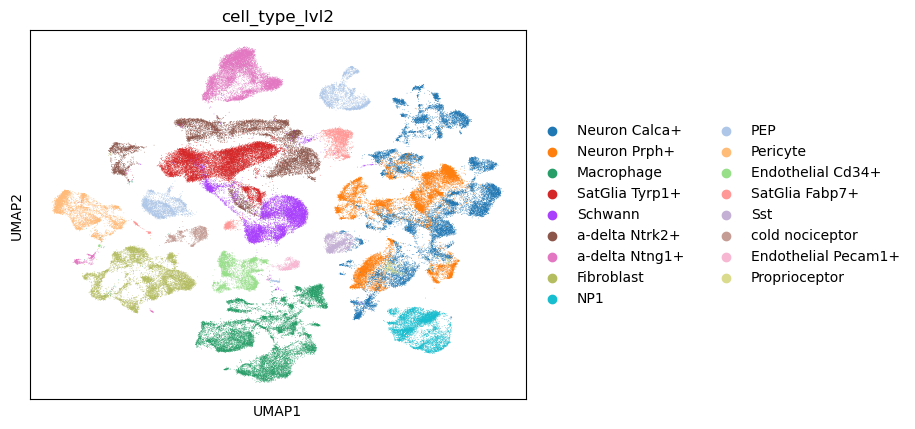

In [250]:
sc.pl.umap(drg, color=["cell_type_lvl2"])

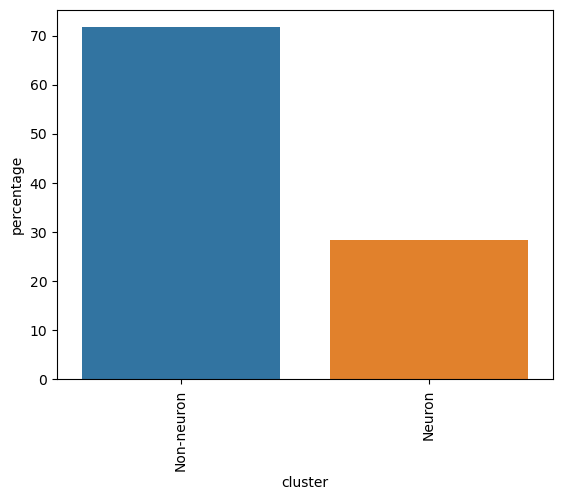

In [259]:
data = {}
for v in drg_sn.obs['cell_type_lvl1'].unique():
    data[v] = drg_sn[drg_sn.obs['cell_type_lvl1'] == v].shape[0] / drg_sn.shape[0] * 100

df = pd.DataFrame.from_dict(data, orient='index', columns=['percentage'])
df['cluster'] = df.index
df = df.reset_index(drop=True)

# Sort the DataFrame by the 'percentage' column in ascending order
df = df.sort_values(by='percentage', ascending =False)

# Create the bar plot
sns.barplot(data=df, x='cluster', y='percentage')

# Customize the x-axis labels rotation
plt.xticks(rotation=90)

# Display the plot
plt.show()

In [224]:
drg=drg[~drg.obs['sampleid'].isin(["mohretal2021"])]

In [226]:
drg

View of AnnData object with n_obs × n_vars = 120453 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'age', 'gender', 'donor', 'platform', 'librarytype', 'genotype', 'info', 'sampleid', 'leiden', 'leiden_res_0.02', 'leiden_res_0.50', 'leiden_res_2.00', 'leiden_res_0.08', 'leiden_res_0.04', 'leiden_res_0.10', 'leiden_res_0.20', 'leiden_res_0.03', 'cell_type_lvl1', 'cell_type_lvl2'
    uns: 'age_colors', 'cell_type_lvl1_colors', 'cell_type_lvl2_colors', 'dendrogram_cell_type_lvl2', 'dendrogram_leiden', 'dendrogram_leiden_res_0.03', 'donor_colors', 'gender_colors', 'genotype_colors', 'info_colors', 'leiden', 'leiden_colors', 'leiden_res_0.02_colors', 'leiden_res_0.03_colors', 'leiden_res_0.04_colors', 'leiden_res_0.08_colors', 'leiden_res_0.10_colors', 'leiden_res_0.20_colors', 'leiden_res_0.50_colors', 'leiden_res_2.00_colors', 'log1p', 'neighbors', 'rank_genes_groups', 'sampleid_colors', 't-test'
    obsm: 'X_pca', 'X_scVI', 'X_uma

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


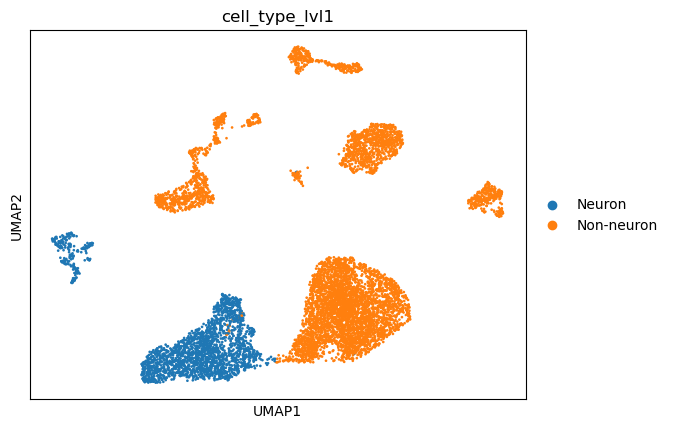

In [262]:
sc.pl.umap(drg_sn, color=["cell_type_lvl1"])

In [205]:
drg_sn.obs["celltype"] = drg_sn.obs["leiden_res_0.20"].map(
    {
        "0": "Schwann_M",
        "1": "Satellite glial cell",
        "2": "Endothelial cell",
        "3": "Macrophage",
        "4": "Pericyte",
        "5": "Fibroblast",
        "6": "Proprioceptor, Pvalb+",
        "7": "Macrophage2",
        "8": "Schwann",
    }
)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


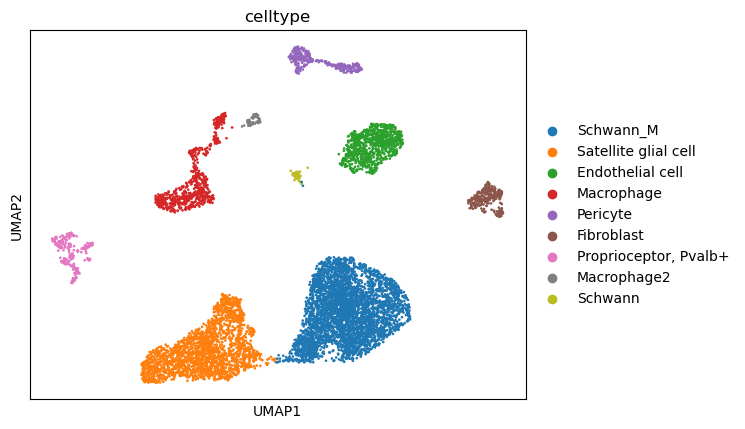

In [207]:
sc.pl.umap(drg_sn, color=["celltype"])

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


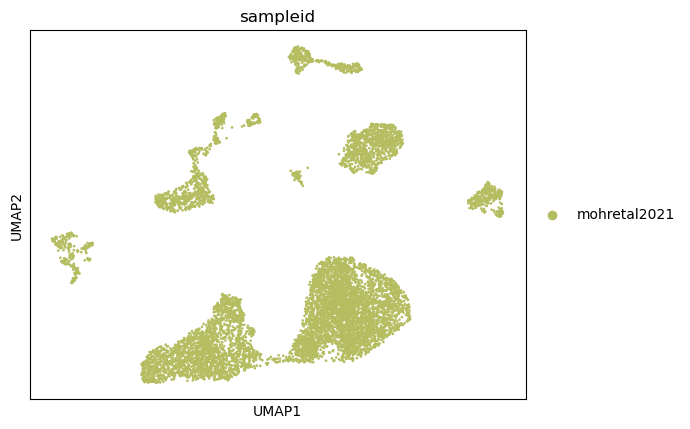

In [185]:
sc.pl.umap(drg_sn, color=["sampleid"])

In [189]:
marker_genes_dict = {
    "Fibroblast": ["Dcn", "Mgp", "Ptgds"],
    "Macrophage": ["Cd68", "Cd96"],
    "Schwann_M": ["Mpz", "Prx", "Mbp"],
    "Schwann_N": ["Cadm2", "Scn7a"],
    "SatGlia": ["Tyrp1", "Fabp7", "Ednrb"],
    "Endothelial": ["Pecam1", "Cd34", "Egfl7", "Cldn5"],
    "Neuron": ["Calca", "Ntrk3", "Prph"],
    "Pericyte": ["Kcnj8", "Notch3"],
    "Lymphoid": ["Cd5", "Pou2af1"],
    "Myeloid": ["Cd80", "Mpo", "S100a9"],
    "Erythrocyte": ["Mpp1", "Spta1", "Hbb-bs", "Hba-a2", "Hba-a1", "Hbb-bt"],
    "c-LTMR": ["Th", "P2ry1", "Pvalb"],
    "adelta-LMTR": ["Ntrk2", "Ntng1", "Tmem108"],
    "Sst": ["Sst", "Nppb", "Oprm1"],
    "NP1": ["Chrna3", "Gfra2"],
    "NP2": ["Chrna3", "Il31ra", "Gfra1"],
    "NP3": ["Chrna3", "Oprm1"],
    "Proprioceptor": ["Ina", "Shh", "Smpx"],
    "PEP": ["Gria4", "Trpa1", "Hopx"],
    "Cold nociceptor": ["Trpm8", "Runx1", "Isl1"],
       
}

categories: 0, 1, 2, etc.
var_group_labels: Fibroblast, Macrophage, Schwann_M, etc.


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


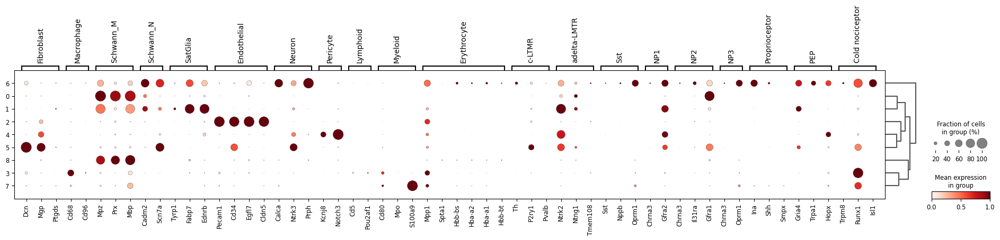

In [191]:
sc.pl.dotplot(drg_sn, marker_genes_dict, "leiden_res_0.20", dendrogram=True, standard_scale="var")

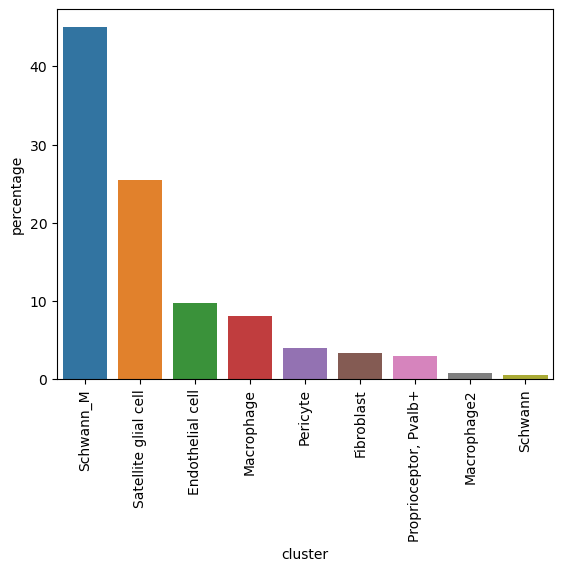

In [221]:
data = {}
for v in drg_sn.obs['celltype'].unique():
    data[v] = drg_sn[drg_sn.obs['celltype'] == v].shape[0] / drg_sn.shape[0] * 100

df = pd.DataFrame.from_dict(data, orient='index', columns=['percentage'])
df['cluster'] = df.index
df = df.reset_index(drop=True)

# Sort the DataFrame by the 'percentage' column in ascending order
df = df.sort_values(by='percentage', ascending =False)

# Create the bar plot
sns.barplot(data=df, x='cluster', y='percentage')

# Customize the x-axis labels rotation
plt.xticks(rotation=90)

# Display the plot
plt.show()

In [ ]:
###Plot some genes

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


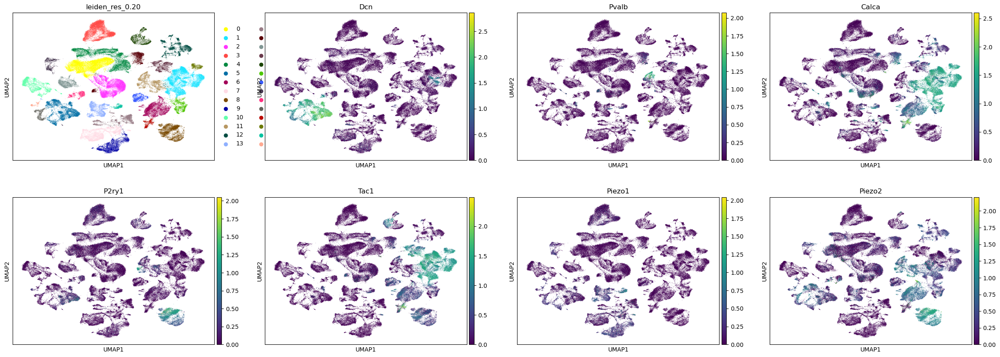

In [274]:
sc.pl.umap(drg, color=["leiden_res_0.20", "Dcn", "Pvalb", "Calca", "P2ry1", "Tac1", "Piezo1", "Piezo2"])

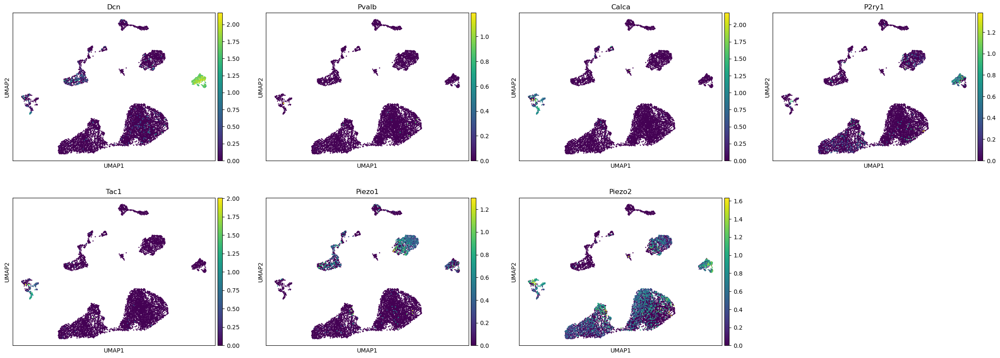

In [272]:
sc.pl.umap(drg_sn, color=["Dcn", "Pvalb", "Calca", "P2ry1", "Tac1", "Piezo1", "Piezo2"])

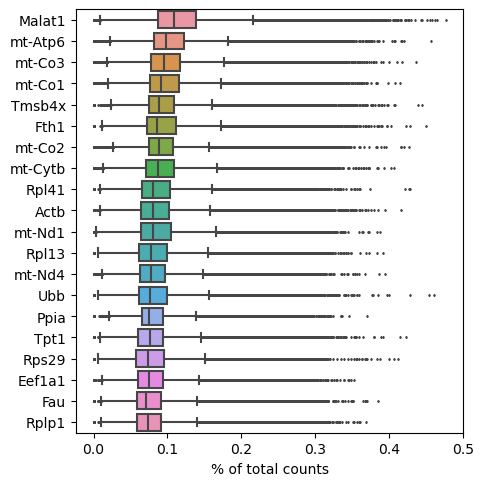

In [278]:
sc.pl.highest_expr_genes(drg, n_top=20)

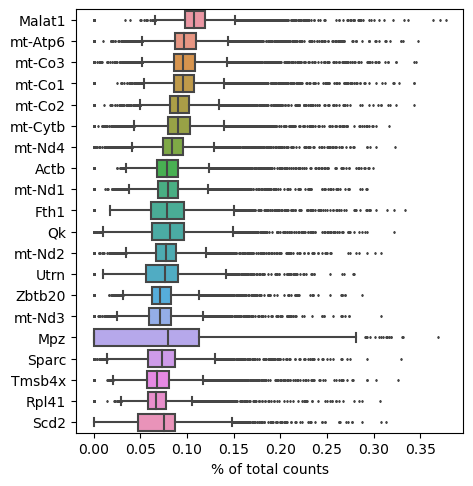

In [280]:
sc.pl.highest_expr_genes(drg_sn, n_top=20)

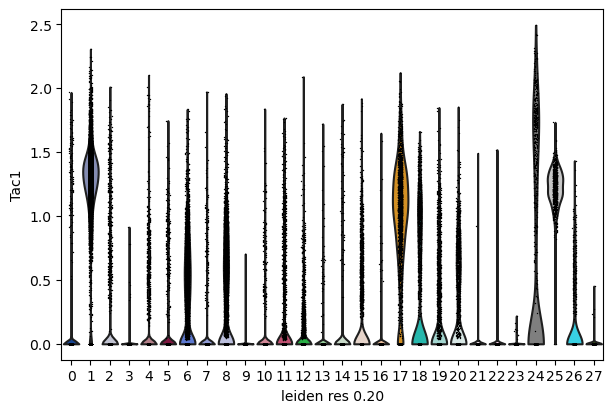

In [311]:
sc.pl.violin(drg, ["Tac1"], groupby="leiden_res_0.20")

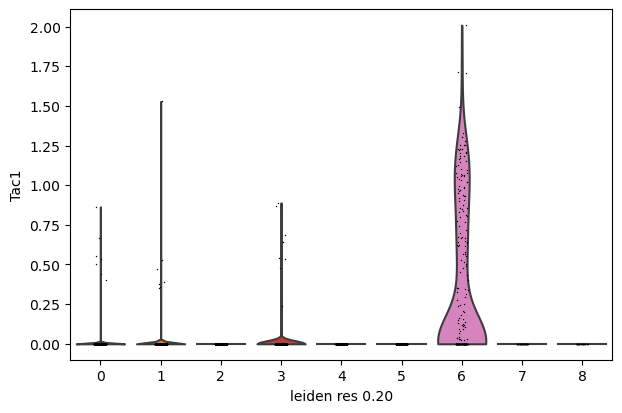

In [313]:
sc.pl.violin(drg_sn, ["Tac1"], groupby="leiden_res_0.20")

KeyError: 'Could not find key n_counts in .var_names or .obs.columns.'

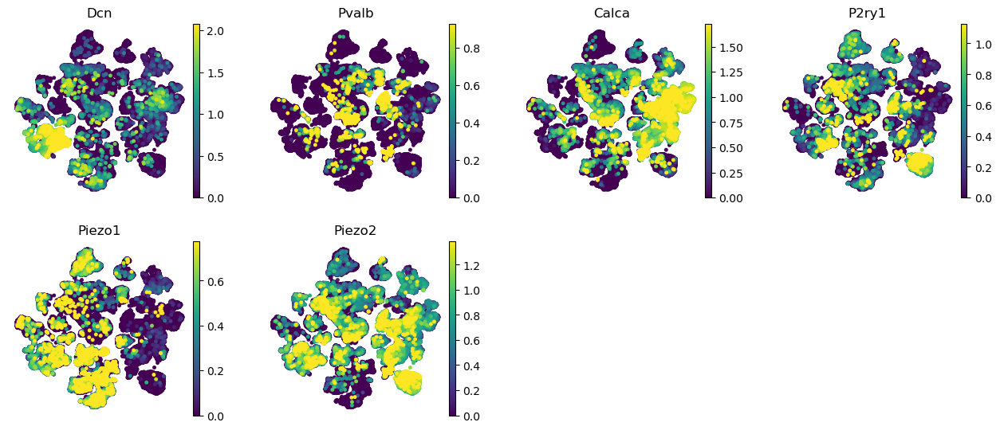

In [319]:
from matplotlib.pyplot import rc_context
color_vars = [
    "Dcn",
    "Pvalb",
    "Calca",
    "P2ry1",
    "Piezo1",
    "Piezo2",
    "n_counts",
    "bulk_labels",
]
with rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(drg, color=color_vars, s=50, frameon=False, ncols=4, vmax="p99")